# Traction, influence de la condition au limite dx=0

In [ ]:
import fedoo as fd
import numpy as np
import pyvista as pv

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\fedoo\core\base.py:48: UserWarning: WARNING: no fast direct sparse solver has been found. Consider installing pypardiso, petsc, or scikit-umfpack to improve computation performance
  warnings.warn(


c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


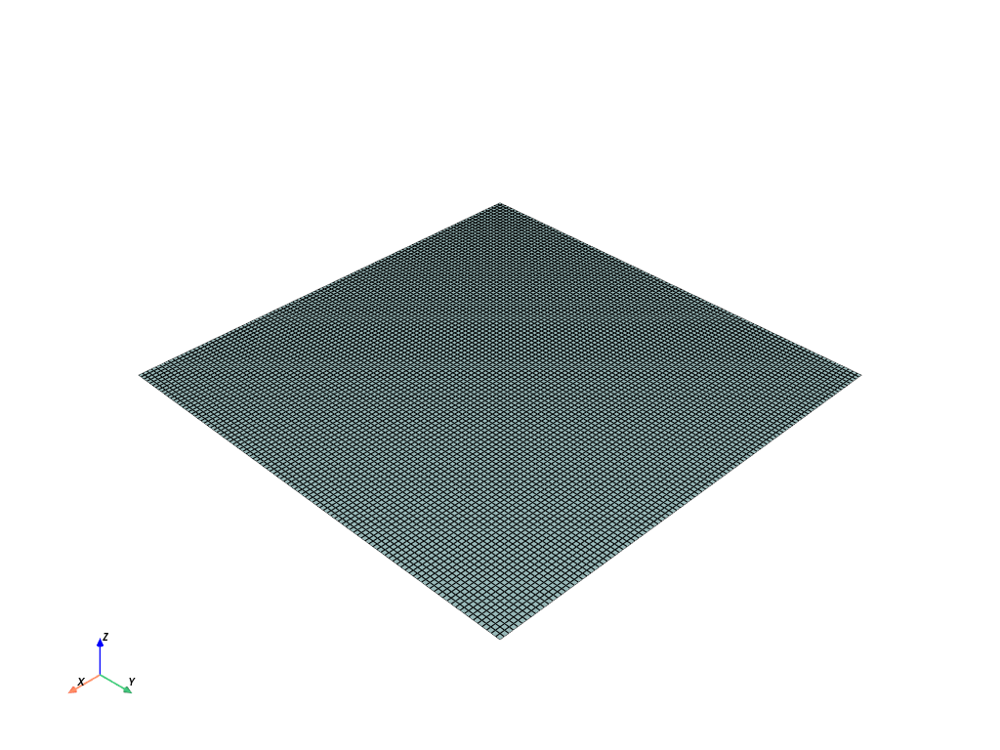

In [2]:
# Contrainte plane (plaque fine)
fd.ModelingSpace("2Dstress")

#Définition de la géométrie
mesh = fd.mesh.rectangle_mesh(nx=101, ny=101, x_min=0,x_max=100,y_min=0,y_max=100)
mesh.plot()

In [3]:
# comportement mecanique : elastique et isotrope
#ici : module d'young et un coefficient de poisson
material = fd.constitutivelaw.ElasticIsotrop(1e6, 0.3)

# méthode numérique FEM
# mathematique appliqué : construire une forme faible du problème
# assembler le tout (mesh + comportement + forme faible) => un système à résoudre KU=F
wf = fd.weakform.StressEquilibrium(material) # equilibre des efforts
assembly = fd.Assembly.create(wf, mesh) 


pb1 = fd.problem.Linear(assembly) # est ce que c'est dynamique ou pas ? ma loi de comportement est elle linéaire ?
pb2 = fd.problem.Linear(assembly)

# Conditions aux limites

## 1.Traction avec encastrement

 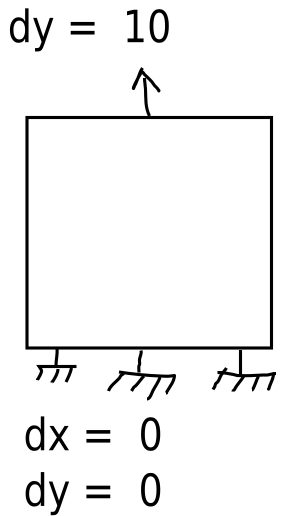

In [4]:
pb1.bc.add("Dirichlet", "bottom", "DispX", 0)  # bc : boundary condition
pb1.bc.add("Dirichlet", "bottom", "DispY", 0)  
pb1.bc.add("Dirichlet", "top", "DispY", 10) 


pb1.solve()

results = pb1.get_results(assembly, ["Stress", "Strain", "Disp", "Fext"]) 

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


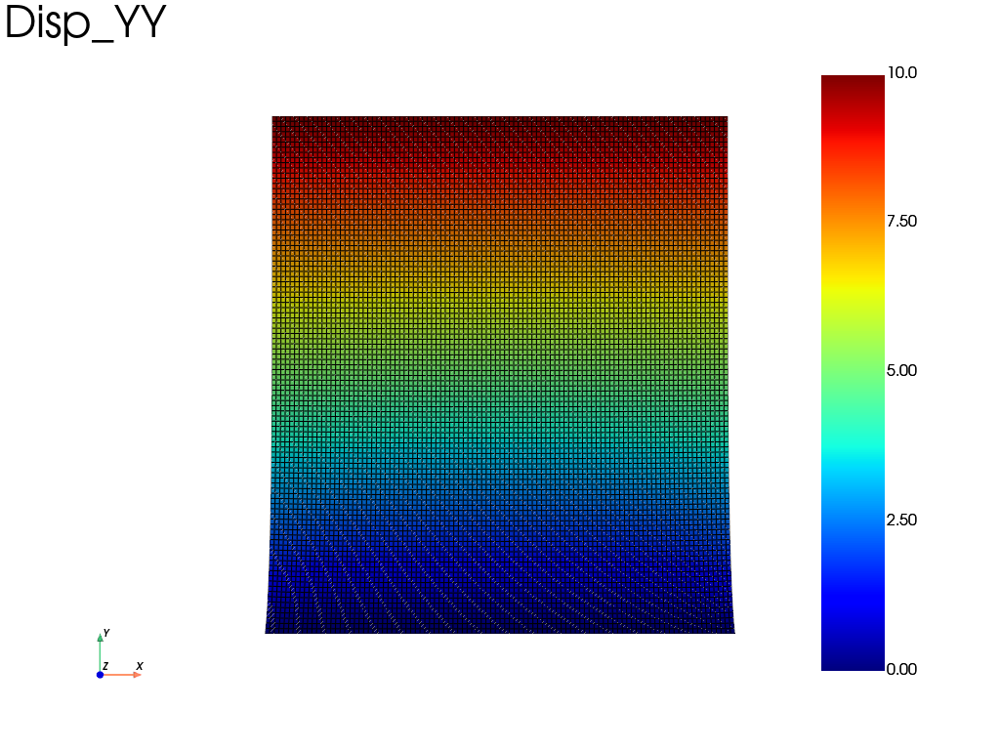

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


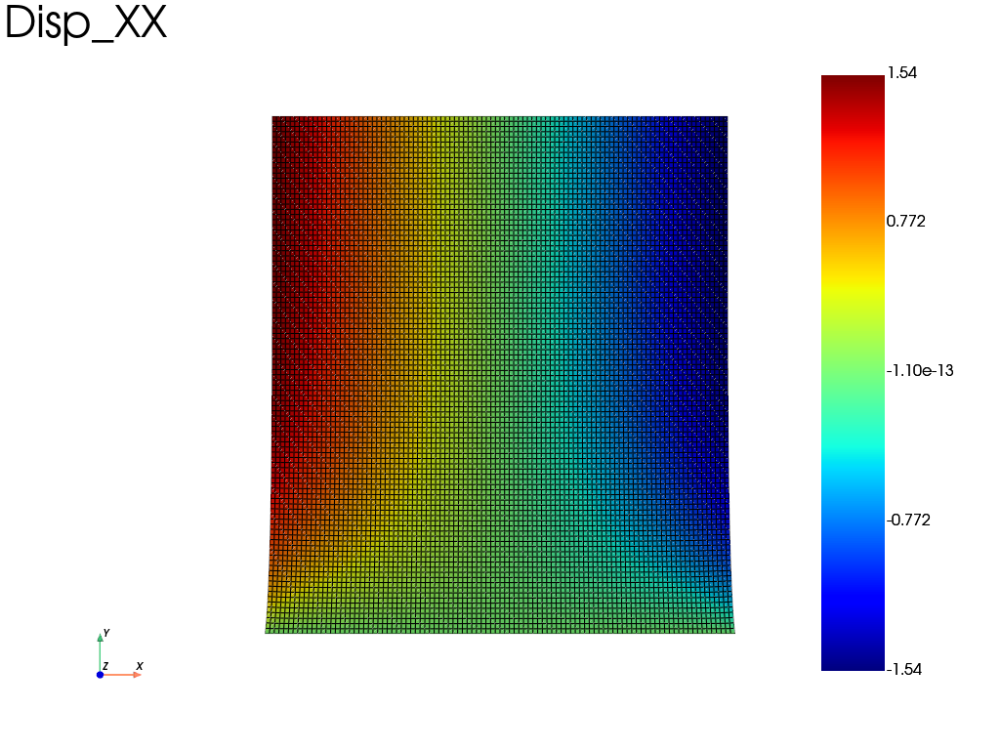

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


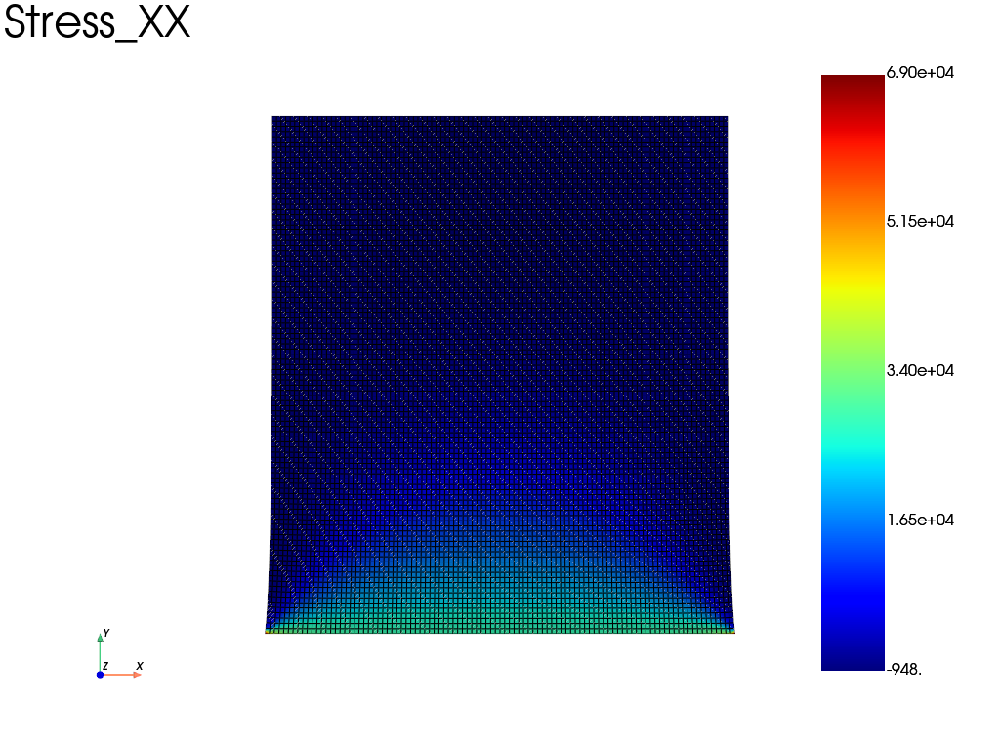

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


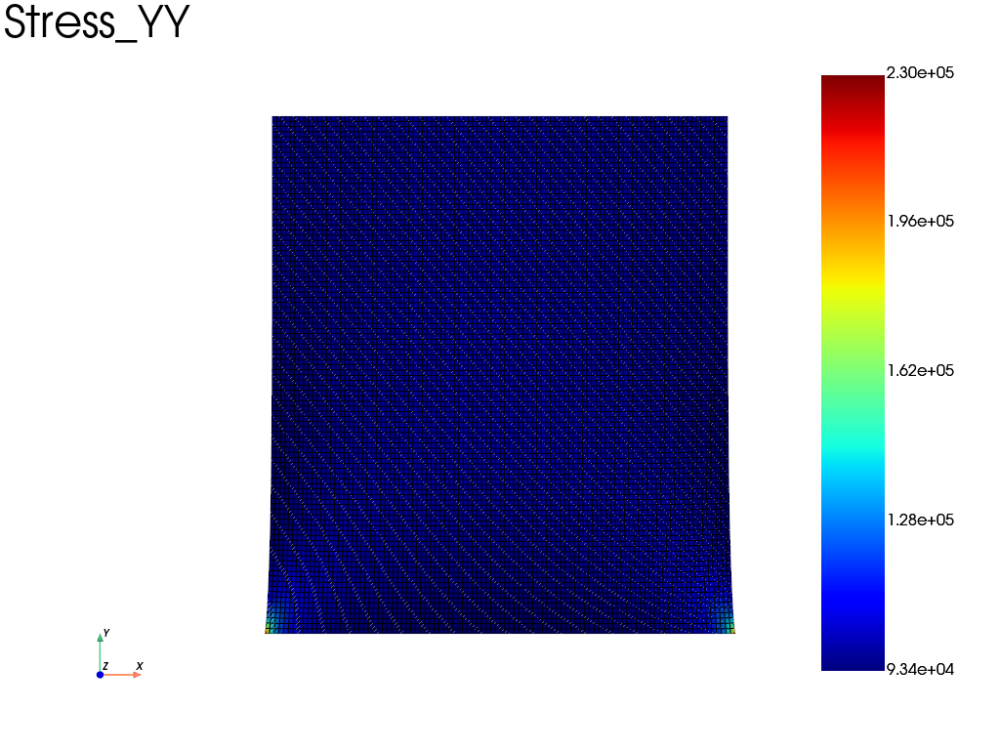

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


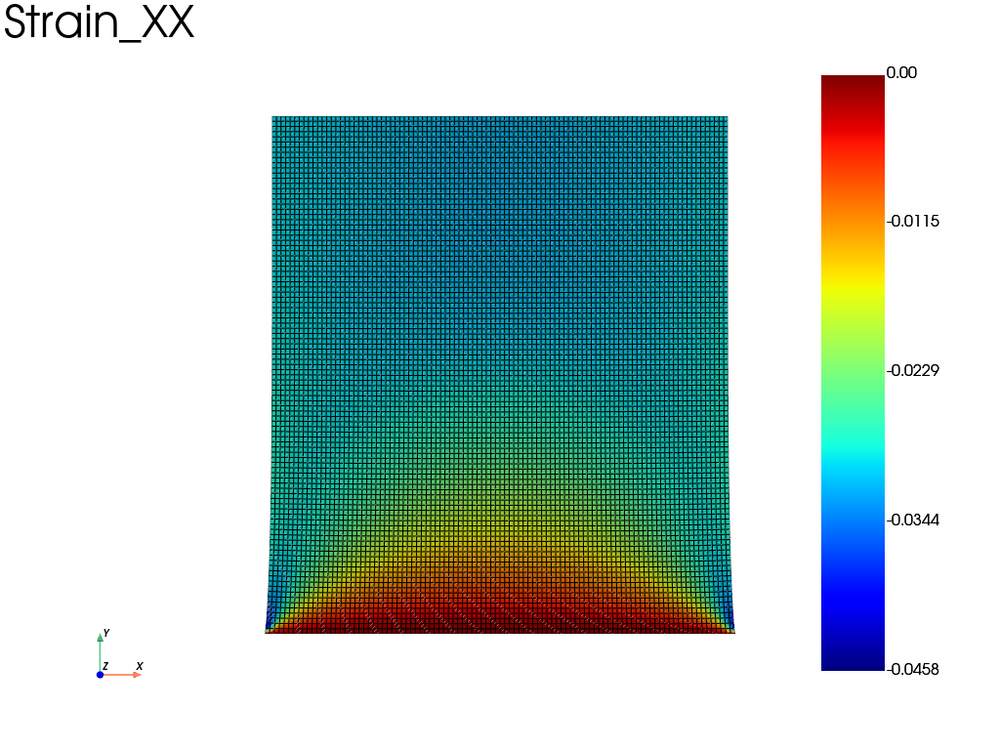

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


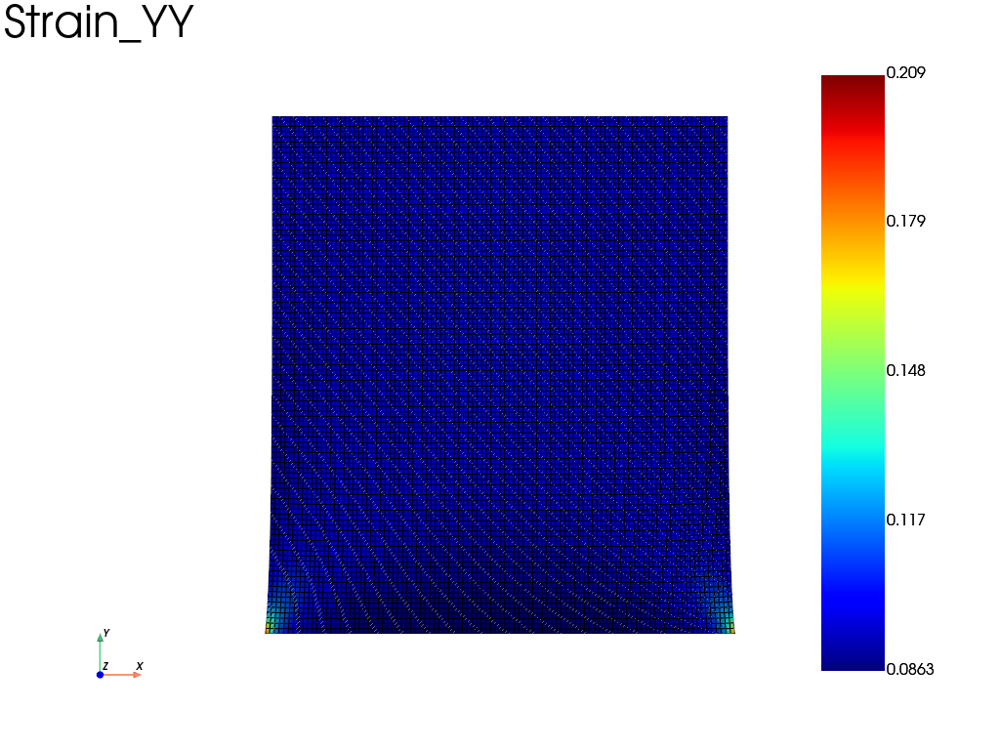

In [5]:
results.plot("Disp", 'YY','Node')
results.plot("Disp", 'XX','Node')
results.plot("Stress", 'XX','Node')
results.plot("Stress", 'YY','Node')
results.plot("Strain", 'XX','Node')
results.plot("Strain", 'YY','Node')

Ce chargement génère une déformation verticale prédominante. Cela est clairement visible dans la cartographie de Disp_YY, où le déplacement augmente progressivement du bas (0) vers le haut (10), ce qui confirme que le déplacement est bien imposé de manière uniforme.

En parallèle, Disp_XX montre une légère déformation horizontale symétrique autour de l’axe vertical, ce qui est typique de la contraction latérale due à l'effet de Poisson : en montant, la structure se contracte horizontalement au centre. Concernant les contraintes, la composante Stress_YY est dominante et se répartit verticalement, avec une intensité plus forte en bas où les efforts sont bloqués, puis elle diminue progressivement vers le haut. Cette distribution est cohérente avec le fait que la réaction est concentrée sur les appuis.

La composante Stress_XX est beaucoup plus faible, localisée et résiduelle, ce qui reflète des effets latéraux secondaires. Enfin, les champs de déformation (Strain) corroborent ces observations : Strain_YY est élevé et globalement uniforme dans la zone centrale, correspondant à l’élongation verticale, tandis que Strain_XX est négatif (contraction), concentré en bas et sur les côtés.

## 2. Traction bloquée uniquement en y

In [ ]:
pb2.bc.add("Dirichlet", "bottom", "DispY", 0)  # seulement 2 conditions aux limites cette fois
pb2.bc.add("Dirichlet", "top", "DispY", 10) 


pb2.solve()

results2 = pb2.get_results(assembly, ["Stress", "Strain", "Disp", "Fext"]) 

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


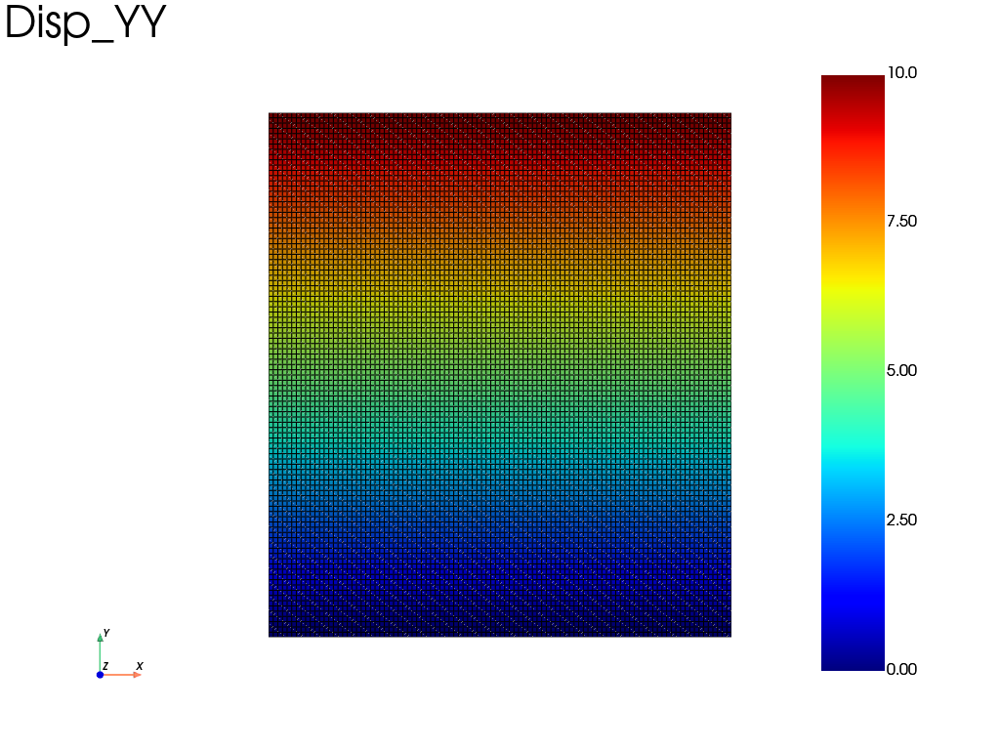

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


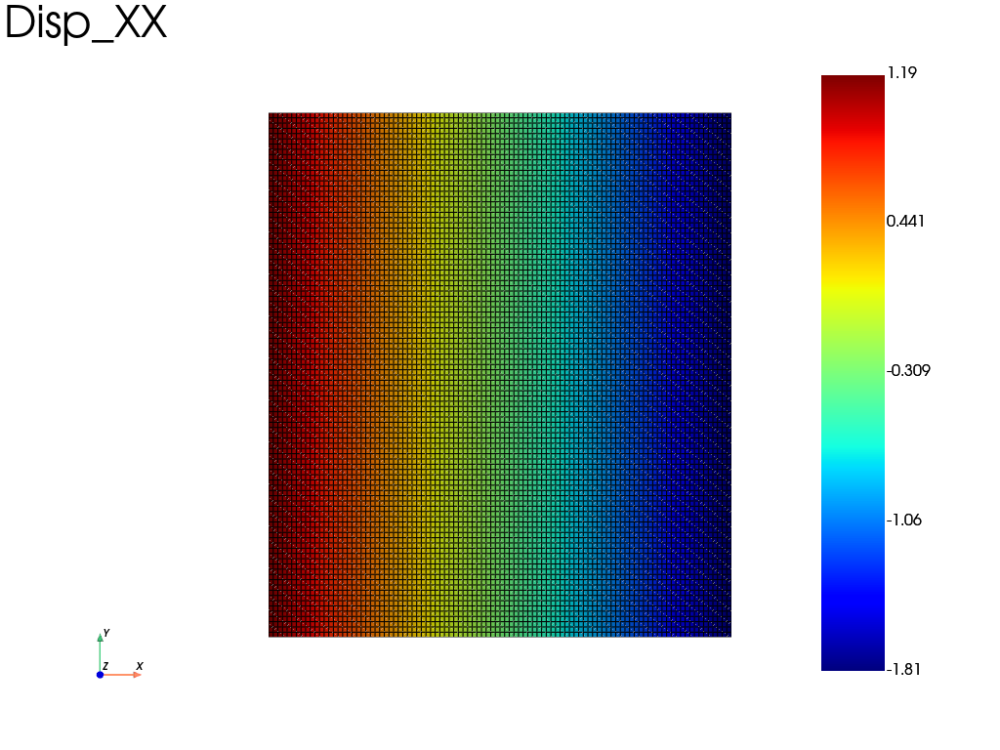

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


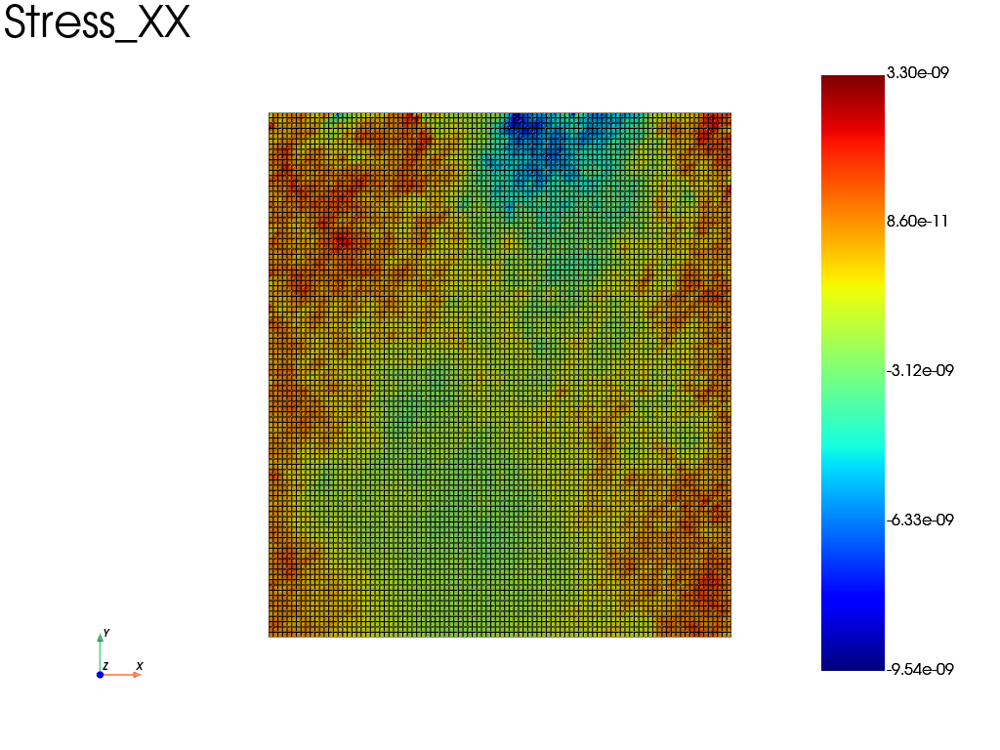

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


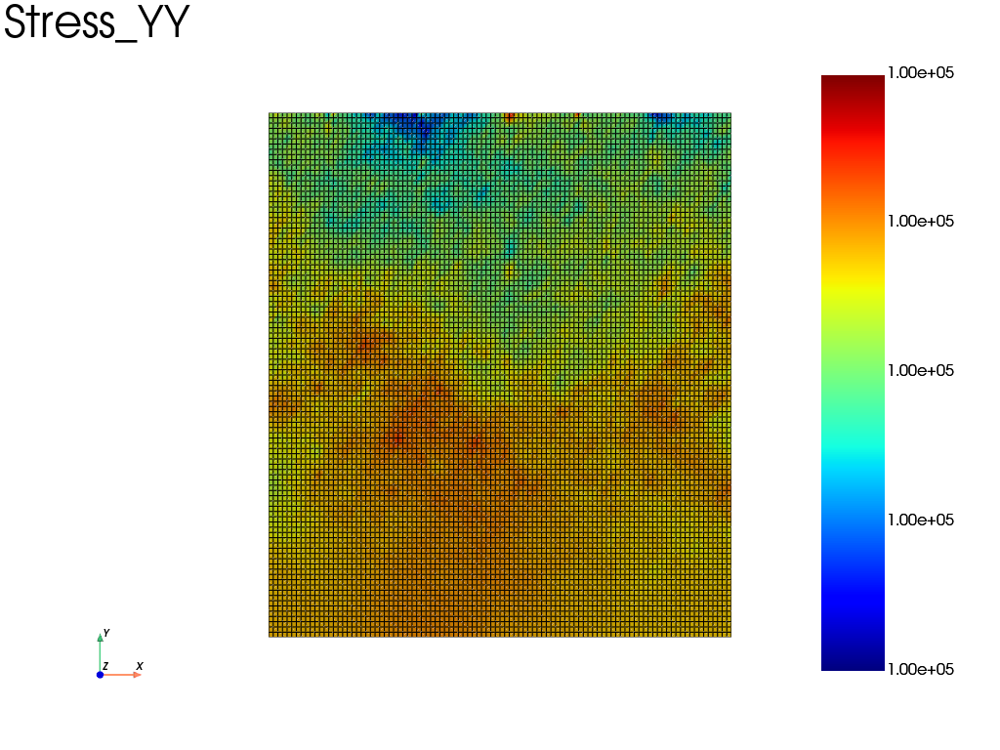

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


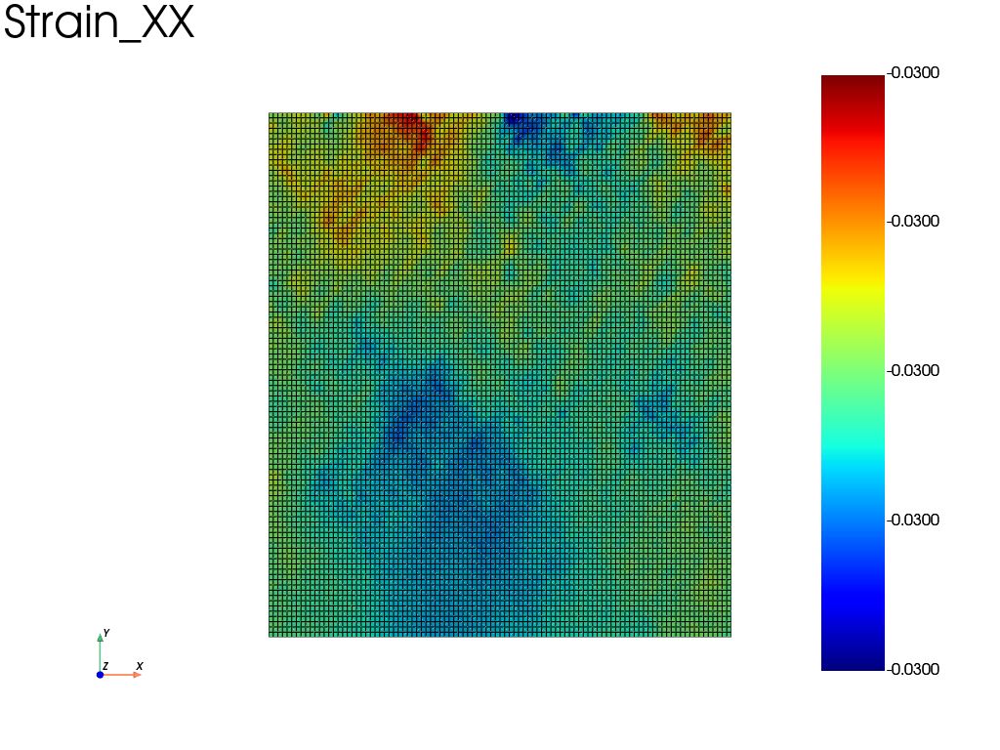

c:\Users\okouo\miniconda3\envs\Fedoo_DSTI\Lib\site-packages\pyvista\jupyter\notebook.py:36: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


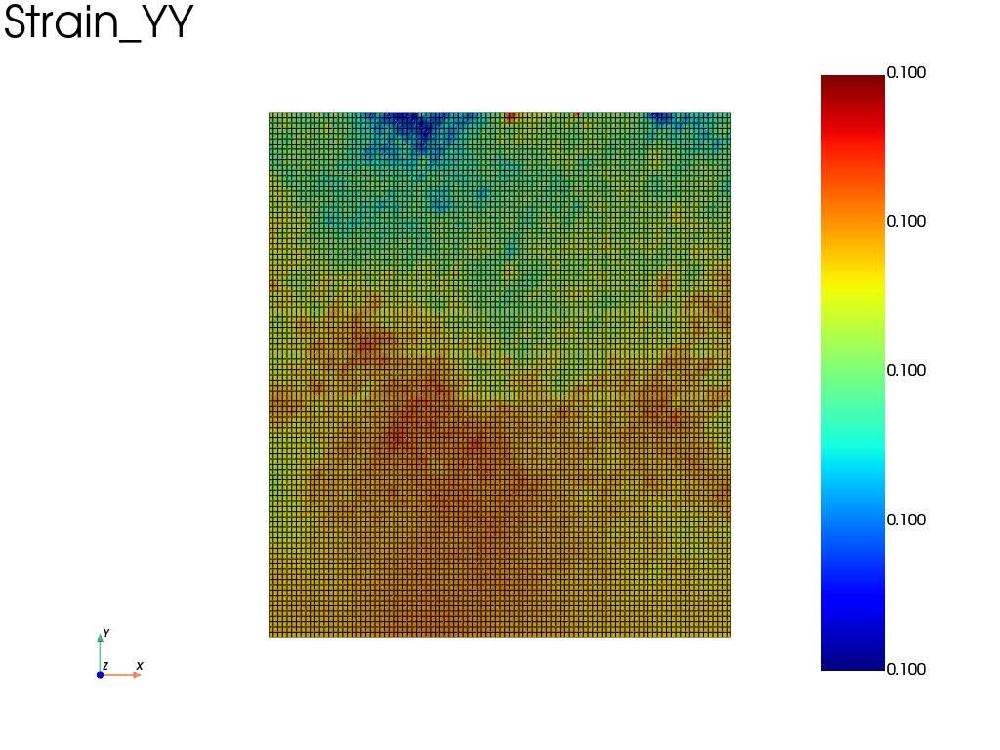

In [7]:
results2.plot("Disp", 'YY','Node')
results2.plot("Disp", 'XX','Node')
results2.plot("Stress", 'XX','Node')
results2.plot("Stress", 'YY','Node')
results2.plot("Strain", 'XX','Node')
results2.plot("Strain", 'YY','Node')

Comparaison des résultats
- Déplacement vertical Disp_YY
Très similaire dans les deux cas : le champ va de 0 (bas) à 10 (haut) de manière linéaire.Cela confirme que le comportement global vertical est dominé par le déplacement imposé en Y.

- Déplacement horizontal Disp_XX
Dans la première simulation (avec dx = 0 en bas), Disp_XX était symétrique et très faible, car le matériau ne pouvait pas se contracter horizontalement.
Dans la seconde simulation, Disp_XX est beaucoup plus marqué, avec des valeurs plus élevées, indiquant une liberté de déformation latérale. L'effet de Poisson est pleinement visible.

- Contraintes Stress_YY
Dans la première simulation, Stress_YY était fortement concentrée aux extrémités de la base, alors que dans la seconde simulation, la contrainte est nettement plus uniforme , indiquant une meilleure redistribution des efforts car les mouvements latéraux ne sont plus contraints.

- Contraintes Stress_XX
Dans la première configuration, les contraintes XX étaient localisées près de la base, dues au blocage latéral. Ici, Stress_XX est quasi nulle dans toute la structure (valeurs ~10⁻⁹), confirmant que la liberté latérale annule quasiment les contraintes horizontales.



# Conclusion sur l’influence de la condition dx = 0

La condition dx = 0 (blocage horizontal en bas) a un rôle majeur sur la distribution des efforts. En empêchant la contraction latérale naturelle induite par la traction verticale (effet de Poisson), elle génère des contraintes supplémentaires horizontales (Stress_XX), crée une concentration de Stress_YY plus marquée en bas et limite le déplacement latéral Disp_XX

À l’inverse, en autorisant le déplacement horizontal, la structure se déforme plus naturellement, les contraintes sont mieux réparties, et l’état de contrainte est globalement moins intense.